<a href="https://colab.research.google.com/github/Dana-Mutairi/hajj-crowd-safety-monitoring/blob/main/Hajj_Crowd_Safety_Monitoring.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# AI Crowd Safety and Flow Monitoring System for Hajj

This project processes surveillance video to detect and track people,
count movement, monitor crowd density, generate heatmaps, protect privacy,
produce safety alerts, and export crowd statistics.

In [ ]:
!pip install -q -U ultralytics

In [ ]:
import os
import cv2
import json
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from ultralytics import YOLO, solutions
from IPython.display import Video, display

print("Project environment is ready.")

Project environment is ready.


In [ ]:
from google.colab import drive

drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
video_path = "/content/drive/MyDrive/hajj_crowd_video.MP4"

if os.path.exists(video_path):
    print("Video found successfully:", video_path)
else:
    print("Video was not found. Check its name and folder.")

Video found successfully: /content/drive/MyDrive/hajj_crowd_video.MP4


In [ ]:
import cv2
import matplotlib.pyplot as plt

# Open the video
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    raise RuntimeError("The video could not be opened.")

# Read video information
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
duration_seconds = total_frames / fps

print("Width:", width)
print("Height:", height)
print("FPS:", fps)
print("Total frames:", total_frames)
print("Duration:", round(duration_seconds, 2), "seconds")

Width: 1280
Height: 576
FPS: 30.0
Total frames: 449
Duration: 14.97 seconds


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from IPython.display import Video, display

# Display the original video
display(
    Video(
        video_path,
        embed=True,
        width=900
    )
)

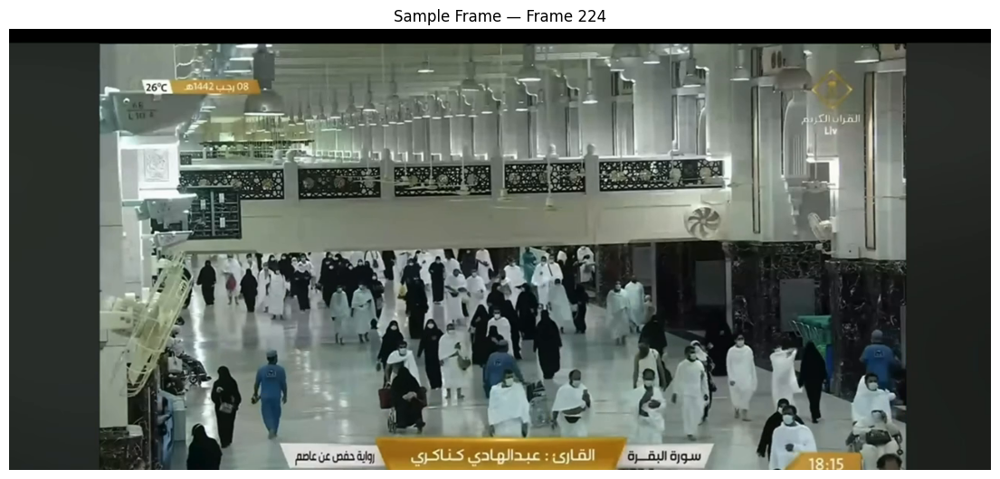

Sample frame saved to: /content/drive/MyDrive/Hajj_Crowd_Project/sample_frame.jpg


In [ ]:
# Select the middle frame
sample_frame_number = total_frames // 2

cap.set(cv2.CAP_PROP_POS_FRAMES, sample_frame_number)
success, sample_frame = cap.read()
cap.release()

if not success:
    raise RuntimeError("The sample frame could not be extracted.")

# Save the sample frame
sample_frame_path = (
    "/content/drive/MyDrive/Hajj_Crowd_Project/sample_frame.jpg"
)

cv2.imwrite(sample_frame_path, sample_frame)

# Convert BGR to RGB for Matplotlib
sample_frame_rgb = cv2.cvtColor(
    sample_frame,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(14, 8))
plt.imshow(sample_frame_rgb)
plt.title(f"Sample Frame — Frame {sample_frame_number}")
plt.axis("off")
plt.show()

print("Sample frame saved to:", sample_frame_path)

## Person Detection Test

A pretrained YOLO model is applied to a sample frame to verify that people
can be detected before processing the complete video.

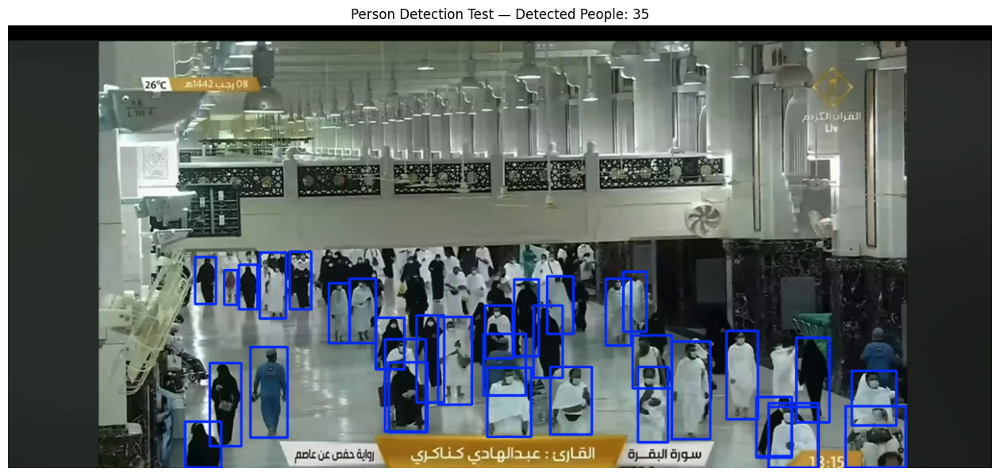

People detected in the sample frame: 35


In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

# Load the pretrained detection model
person_model = YOLO("yolo26n.pt")

# Detect only class 0, which represents "person"
detection_results = person_model.predict(
    source=sample_frame,
    classes=[0],
    conf=0.20,
    imgsz=1280,
    verbose=False
)

# Count detected people
people_count = len(detection_results[0].boxes)

# Draw the detections
detected_frame = detection_results[0].plot(
    labels=False,
    conf=False,
    line_width=2
)

# Convert BGR to RGB for Matplotlib
detected_frame_rgb = cv2.cvtColor(
    detected_frame,
    cv2.COLOR_BGR2RGB
)

# Display the result
plt.figure(figsize=(16, 9))
plt.imshow(detected_frame_rgb)
plt.title(f"Person Detection Test — Detected People: {people_count}")
plt.axis("off")
plt.show()

print("People detected in the sample frame:", people_count)

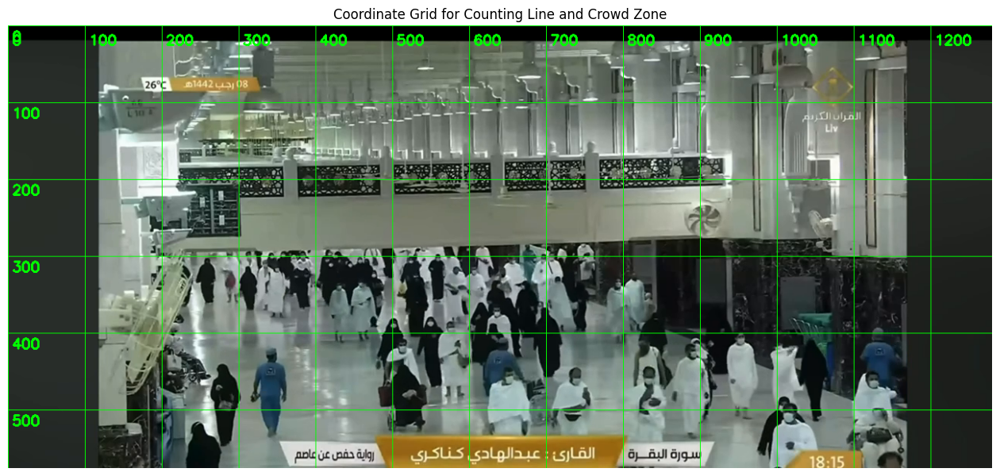

In [ ]:
coordinate_frame = sample_frame.copy()

# Draw vertical coordinate lines
for x in range(0, width, 100):
    cv2.line(
        coordinate_frame,
        (x, 0),
        (x, height),
        (0, 255, 0),
        1
    )

    cv2.putText(
        coordinate_frame,
        str(x),
        (x + 5, 25),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.6,
        (0, 255, 0),
        2
    )

# Draw horizontal coordinate lines
for y in range(0, height, 100):
    cv2.line(
        coordinate_frame,
        (0, y),
        (width, y),
        (0, 255, 0),
        1
    )

    cv2.putText(
        coordinate_frame,
        str(y),
        (5, y + 20),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.6,
        (0, 255, 0),
        2
    )

coordinate_rgb = cv2.cvtColor(
    coordinate_frame,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(16, 9))
plt.imshow(coordinate_rgb)
plt.title("Coordinate Grid for Counting Line and Crowd Zone")
plt.axis("off")
plt.show()

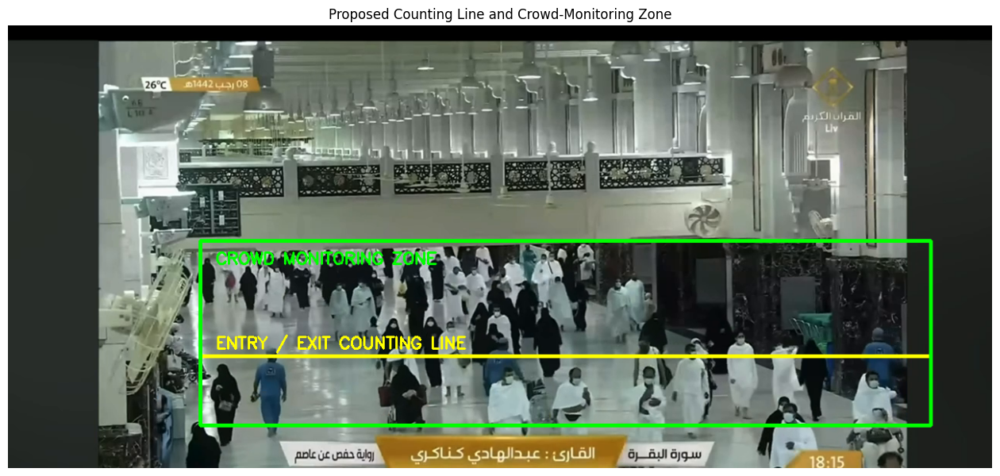

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

region_preview = sample_frame.copy()

# Entry/exit counting line
counting_line = [
    (250, 430),
    (1200, 430)
]

# Crowd-monitoring ROI
crowd_region = [
    (250, 280),
    (1200, 280),
    (1200, 520),
    (250, 520)
]

# Draw the counting line in yellow
cv2.line(
    region_preview,
    counting_line[0],
    counting_line[1],
    (0, 255, 255),
    4
)

cv2.putText(
    region_preview,
    "ENTRY / EXIT COUNTING LINE",
    (270, 420),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.7,
    (0, 255, 255),
    2
)

# Draw the crowd ROI in green
roi_points = np.array(
    crowd_region,
    dtype=np.int32
).reshape((-1, 1, 2))

cv2.polylines(
    region_preview,
    [roi_points],
    isClosed=True,
    color=(0, 255, 0),
    thickness=3
)

cv2.putText(
    region_preview,
    "CROWD MONITORING ZONE",
    (270, 310),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.7,
    (0, 255, 0),
    2
)

# Display
region_preview_rgb = cv2.cvtColor(
    region_preview,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(16, 9))
plt.imshow(region_preview_rgb)
plt.title("Proposed Counting Line and Crowd-Monitoring Zone")
plt.axis("off")
plt.show()

## People Tracking and Entry/Exit Counting

YOLO detects and tracks people across video frames. ObjectCounter records a
person once when their tracked center crosses the selected counting line.

In [ ]:
import cv2
import os
from ultralytics import solutions
from IPython.display import Video, display

# Temporary output paths
raw_test_output = "/content/counting_test_raw.mp4"
final_test_output = "/content/counting_test.mp4"

# Open the original video
cap = cv2.VideoCapture(video_path)

video_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
video_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
video_fps = cap.get(cv2.CAP_PROP_FPS)

if not cap.isOpened():
    raise RuntimeError("Could not open the input video.")

# Process only the first 10 seconds
test_seconds = 10
maximum_test_frames = int(video_fps * test_seconds)

# Create the entry/exit counter
people_counter = solutions.ObjectCounter(
    model="yolo26n.pt",
    region=counting_line,
    classes=[0],
    conf=0.25,
    imgsz=1280,
    tracker="bytetrack.yaml",
    show=False,
    show_labels=False,
    show_conf=False
)

# Create the video writer
writer = cv2.VideoWriter(
    raw_test_output,
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps,
    (video_width, video_height)
)

processed_frames = 0
latest_result = None

while cap.isOpened() and processed_frames < maximum_test_frames:

    success, video_frame = cap.read()

    if not success:
        break

    # Detect, track and count people
    latest_result = people_counter(video_frame)

    # Write the annotated frame
    writer.write(latest_result.plot_im)

    processed_frames += 1

cap.release()
writer.release()

print("Processed frames:", processed_frames)
print("IN count:", people_counter.in_count)
print("OUT count:", people_counter.out_count)

Ultralytics Solutions: ✅ {'source': None, 'model': 'yolo26n.pt', 'classes': [0], 'show_conf': False, 'show_labels': False, 'show_boxes': True, 'region': [(250, 430), (1200, 430)], 'colormap': 21, 'show_in': True, 'show_out': True, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'figsize': (12.8, 7.2), 'blur_ratio': 0.5, 'vision_point': (20, 20), 'crop_dir': 'cropped-detections', 'json_file': None, 'line_width': 2, 'records': 5, 'fps': 30.0, 'max_hist': 5, 'meter_per_pixel': 0.05, 'max_speed': 120, 'show': False, 'iou': 0.7, 'conf': 0.25, 'device': None, 'max_det': 300, 'quantize': None, 'imgsz': 1280, 'tracker': 'bytetrack.yaml', 'verbose': True, 'data': 'images'}
WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
Using Python 3.12.13 environment at: /usr
Resolved 2 packages in 441ms
Prepared 1 package in 86ms
Installed 1 package in 8ms
 + 

In [ ]:
os.system(
    f'ffmpeg -i "{raw_test_output}" '
    f'-vcodec libx264 -pix_fmt yuv420p '
    f'"{final_test_output}" -y -loglevel quiet'
)

print("Counting test video created.")
display(Video(final_test_output, embed=True, width=900))


Counting test video created.


## Crowd Density and Zone Monitoring

RegionCounter measures the current number of tracked people inside the
crowd-monitoring zone. The occupancy value is used to classify crowd density
as low, medium, or high and generate a warning.

In [ ]:
import cv2
import os
from ultralytics import solutions
from IPython.display import Video, display

# Output paths
raw_region_output = "/content/region_test_raw.mp4"
final_region_output = "/content/region_test.mp4"

# Define the named crowd zone
crowd_zones = {
    "Main Crowd Zone": crowd_region
}

# Open the original video
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    raise RuntimeError("Could not open the input video.")

video_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
video_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
video_fps = cap.get(cv2.CAP_PROP_FPS)

# Process the first 10 seconds
test_seconds = 10
maximum_test_frames = int(video_fps * test_seconds)

# Initialize RegionCounter
region_counter = solutions.RegionCounter(
    model="yolo26n.pt",
    region=crowd_zones,
    classes=[0],
    conf=0.25,
    imgsz=1280,
    tracker="bytetrack.yaml",
    show=False,
    show_labels=False,
    show_conf=False
)

# Create output writer
writer = cv2.VideoWriter(
    raw_region_output,
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps,
    (video_width, video_height)
)

occupancy_values = []
processed_frames = 0

while cap.isOpened() and processed_frames < maximum_test_frames:

    success, video_frame = cap.read()

    if not success:
        break

    # Detect, track and count people inside the ROI
    region_result = region_counter(video_frame)
    output_frame = region_result.plot_im

    # Read current occupancy
    current_occupancy = region_result.region_counts.get(
        "Main Crowd Zone",
        0
    )

    occupancy_values.append(current_occupancy)

    # Temporary density thresholds
    if current_occupancy >= 30:
        density_status = "HIGH CROWD DENSITY - WARNING"
        status_color = (0, 0, 255)          # Red

    elif current_occupancy >= 20:
        density_status = "MEDIUM CROWD DENSITY"
        status_color = (0, 165, 255)        # Orange

    else:
        density_status = "LOW CROWD DENSITY"
        status_color = (0, 255, 0)          # Green

    # Display occupancy and status
    cv2.rectangle(
        output_frame,
        (20, 20),
        (600, 105),
        (0, 0, 0),
        -1
    )

    cv2.putText(
        output_frame,
        f"Current occupancy: {current_occupancy}",
        (35, 55),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2
    )

    cv2.putText(
        output_frame,
        density_status,
        (35, 90),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.75,
        status_color,
        2
    )

    writer.write(output_frame)
    processed_frames += 1

cap.release()
writer.release()

print("Processed frames:", processed_frames)
print("Minimum occupancy:", min(occupancy_values))
print("Maximum occupancy:", max(occupancy_values))
print(
    "Average occupancy:",
    round(sum(occupancy_values) / len(occupancy_values), 2)
)

Ultralytics Solutions: ✅ {'source': None, 'model': 'yolo26n.pt', 'classes': [0], 'show_conf': False, 'show_labels': False, 'show_boxes': True, 'region': {'Main Crowd Zone': [(250, 280), (1200, 280), (1200, 520), (250, 520)]}, 'colormap': 21, 'show_in': True, 'show_out': True, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'figsize': (12.8, 7.2), 'blur_ratio': 0.5, 'vision_point': (20, 20), 'crop_dir': 'cropped-detections', 'json_file': None, 'line_width': 2, 'records': 5, 'fps': 30.0, 'max_hist': 5, 'meter_per_pixel': 0.05, 'max_speed': 120, 'show': False, 'iou': 0.7, 'conf': 0.25, 'device': None, 'max_det': 300, 'quantize': None, 'imgsz': 1280, 'tracker': 'bytetrack.yaml', 'verbose': True, 'data': 'images'}
0: 1280x1280 6.9ms, 29 person
Speed: 93.3ms track, 6.9ms solution per image at shape (1, 3, 1280, 1280)

1: 1280x1280 4.6ms, 29 person
Speed: 22.2ms track, 4.6ms solution per image at shape (1, 3, 1280, 1280)

2: 1280x1280 4.8ms, 29 person
Speed:

In [ ]:
os.system(
    f'ffmpeg -i "{raw_region_output}" '
    f'-vcodec libx264 -pix_fmt yuv420p '
    f'"{final_region_output}" -y -loglevel quiet'
)

display(Video(final_region_output, embed=True, width=900))

In [ ]:
import math

# Calculate occupancy statistics
minimum_occupancy = min(occupancy_values)
maximum_occupancy = max(occupancy_values)
average_occupancy = sum(occupancy_values) / len(occupancy_values)

# Threshold between minimum and average
medium_threshold = math.ceil(
    (minimum_occupancy + average_occupancy) / 2
)

# Threshold between average and maximum
high_threshold = math.ceil(
    (average_occupancy + maximum_occupancy) / 2
)

print("Minimum occupancy:", minimum_occupancy)
print("Average occupancy:", round(average_occupancy, 2))
print("Maximum occupancy:", maximum_occupancy)

print("\nSelected thresholds:")
print(f"Low density: fewer than {medium_threshold} people")
print(
    f"Medium density: {medium_threshold} "
    f"to {high_threshold - 1} people"
)
print(f"High density: {high_threshold} people or more")

Minimum occupancy: 17
Average occupancy: 24.16
Maximum occupancy: 30

Selected thresholds:
Low density: fewer than 21 people
Medium density: 21 to 27 people
High density: 28 people or more


In [ ]:
def classify_crowd_density(current_occupancy):

    if current_occupancy >= high_threshold:
        return (
            "HIGH CROWD DENSITY - WARNING",
            (0, 0, 255)       # Red
        )

    elif current_occupancy >= medium_threshold:
        return (
            "MEDIUM CROWD DENSITY",
            (0, 165, 255)     # Orange
        )

    else:
        return (
            "LOW CROWD DENSITY",
            (0, 255, 0)       # Green
        )


# These lines must remain outside the function
test_values = [
    minimum_occupancy,
    round(average_occupancy),
    maximum_occupancy
]

for value in test_values:
    status, color = classify_crowd_density(value)
    print(f"Occupancy {value}: {status}")

Occupancy 17: LOW CROWD DENSITY
Occupancy 24: MEDIUM CROWD DENSITY
Occupancy 30: HIGH CROWD DENSITY - WARNING


In [ ]:
from ultralytics import YOLO
from IPython.display import Video, display
import cv2
import numpy as np
import pandas as pd
import subprocess
import os

# --------------------------------------------------
# 1. Paths and model
# --------------------------------------------------
zone_model = YOLO("yolo26n.pt")

zone_raw_path = "/content/hajj_zones_raw.mp4"
zone_video_path = (
    "/content/drive/MyDrive/Hajj_Crowd_Project/"
    "hajj_zone_monitoring.mp4"
)
zone_csv_path = (
    "/content/drive/MyDrive/Hajj_Crowd_Project/"
    "hajj_zone_summary.csv"
)

# --------------------------------------------------
# 2. Open the original video
# --------------------------------------------------
cap = cv2.VideoCapture(video_path)

fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

writer = cv2.VideoWriter(
    zone_raw_path,
    cv2.VideoWriter_fourcc(*"mp4v"),
    fps,
    (width, height)
)

# --------------------------------------------------
# 3. Use the same monitoring area as the main project
# --------------------------------------------------
roi_left = 250
roi_right = 1200
roi_top = 280
roi_bottom = 520

# Divide the monitoring area into three equal zones
zone_edges = np.linspace(
    roi_left,
    roi_right,
    4
).astype(int)


def get_zone_status(count):
    """Return crowd level and its BGR color."""

    if count >= 10:
        return "HIGH", (0, 0, 255)       # Red

    elif count >= 7:
        return "WARNING", (0, 165, 255)  # Orange

    else:
        return "SAFE", (0, 255, 0)       # Green


zone_records = []
frame_index = 0

# --------------------------------------------------
# 4. Process every frame
# --------------------------------------------------
while cap.isOpened():

    success, frame = cap.read()

    if not success:
        break

    result = zone_model.track(
        source=frame,
        persist=True,
        tracker="bytetrack.yaml",
        classes=[0],
        conf=0.25,
        imgsz=1280,
        verbose=False
    )[0]

    zone_counts = [0, 0, 0]
    detected_people = []

    if result.boxes is not None:

        boxes = result.boxes.xyxy.cpu().numpy().astype(int)

        for box in boxes:

            x1, y1, x2, y2 = box

            # Bottom-center estimates the person's floor position
            person_x = int((x1 + x2) / 2)
            person_y = int(y2)

            zone_number = None

            # Only count people whose floor position is inside the ROI
            if (
                roi_left <= person_x <= roi_right
                and roi_top <= person_y <= roi_bottom
            ):

                if person_x < zone_edges[1]:
                    zone_number = 0

                elif person_x < zone_edges[2]:
                    zone_number = 1

                else:
                    zone_number = 2

                zone_counts[zone_number] += 1

            detected_people.append((box, zone_number))

    # Identify the most crowded zone
    most_crowded_index = int(np.argmax(zone_counts))

    zone_statuses = [
        get_zone_status(count)
        for count in zone_counts
    ]

    # --------------------------------------------------
    # 5. Draw zones
    # --------------------------------------------------
    for zone_index in range(3):

        x_start = zone_edges[zone_index]
        x_end = zone_edges[zone_index + 1]

        status, color = zone_statuses[zone_index]

        # Make the most crowded zone border thicker
        thickness = (
            6 if zone_index == most_crowded_index else 3
        )

        cv2.rectangle(
            frame,
            (x_start, roi_top),
            (x_end, roi_bottom),
            color,
            thickness
        )

        label = (
            f"ZONE {zone_index + 1}: "
            f"{zone_counts[zone_index]} - {status}"
        )

        cv2.putText(
            frame,
            label,
            (x_start + 10, roi_top + 30),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.55,
            color,
            2
        )

    # --------------------------------------------------
    # 6. Draw person boxes
    # --------------------------------------------------
    for box, zone_number in detected_people:

        x1, y1, x2, y2 = box

        if zone_number is not None:
            _, box_color = zone_statuses[zone_number]
        else:
            box_color = (180, 180, 180)

        cv2.rectangle(
            frame,
            (x1, y1),
            (x2, y2),
            box_color,
            2
        )

    # Display the most crowded zone
    dashboard_text = (
        f"MOST CROWDED: ZONE {most_crowded_index + 1} "
        f"({zone_counts[most_crowded_index]} people)"
    )

    cv2.rectangle(
        frame,
        (15, 15),
        (620, 65),
        (0, 0, 0),
        -1
    )

    cv2.putText(
        frame,
        dashboard_text,
        (25, 50),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.75,
        (255, 255, 255),
        2
    )

    writer.write(frame)

    # Save one record per second
    if frame_index % max(1, int(fps)) == 0:

        zone_records.append({
            "timestamp_seconds": round(
                frame_index / fps,
                2
            ),
            "zone_1_count": zone_counts[0],
            "zone_2_count": zone_counts[1],
            "zone_3_count": zone_counts[2],
            "most_crowded_zone":
                most_crowded_index + 1,
            "total_inside_zones": sum(zone_counts)
        })

    frame_index += 1

cap.release()
writer.release()

# --------------------------------------------------
# 7. Save zone data to CSV
# --------------------------------------------------
zone_dataframe = pd.DataFrame(zone_records)
zone_dataframe.to_csv(zone_csv_path, index=False)

# --------------------------------------------------
# 8. Convert the video for Colab and Drive
# --------------------------------------------------
subprocess.run(
    [
        "ffmpeg",
        "-y",
        "-i", zone_raw_path,
        "-c:v", "libx264",
        "-pix_fmt", "yuv420p",
        zone_video_path
    ],
    stdout=subprocess.DEVNULL,
    stderr=subprocess.DEVNULL
)

print("Zone monitoring completed.")
print("Processed frames:", frame_index)
print("Video saved at:", zone_video_path)
print("CSV saved at:", zone_csv_path)

# --------------------------------------------------
# 9. Display the final video
# --------------------------------------------------
display(
    Video(
        zone_video_path,
        embed=True,
        width=900
    )
)

OSError: Cannot save file into a non-existent directory: '/content/drive/MyDrive/Hajj_Crowd_Project'

## Movement Heatmap

The Heatmap solution tracks detected people across video frames and accumulates
their locations. Warmer colors represent areas with higher movement or repeated
occupancy, while cooler colors represent less frequently used areas.

In [ ]:
import cv2
import os
from ultralytics import solutions
from IPython.display import Video, display

# Output paths
raw_heatmap_output = "/content/heatmap_test_raw.mp4"
final_heatmap_output = "/content/heatmap_test.mp4"

# Open the original video from the beginning
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    raise RuntimeError("Could not open the input video.")

video_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
video_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
video_fps = cap.get(cv2.CAP_PROP_FPS)

# Process the first 10 seconds
test_seconds = 10
maximum_test_frames = int(video_fps * test_seconds)

# Initialize the Heatmap solution
movement_heatmap = solutions.Heatmap(
    model="yolo26n.pt",
    classes=[0],
    conf=0.25,
    imgsz=1280,
    tracker="bytetrack.yaml",
    colormap=cv2.COLORMAP_JET,
    show=False,
    show_labels=False,
    show_conf=False
)

# Create the output-video writer
writer = cv2.VideoWriter(
    raw_heatmap_output,
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps,
    (video_width, video_height)
)

processed_frames = 0

while cap.isOpened() and processed_frames < maximum_test_frames:

    success, video_frame = cap.read()

    if not success:
        break

    # Detect, track and accumulate people's locations
    heatmap_result = movement_heatmap(video_frame)

    # Write the heatmap frame
    writer.write(heatmap_result.plot_im)

    processed_frames += 1

cap.release()
writer.release()

print("Processed heatmap frames:", processed_frames)
print("Raw heatmap video created:", raw_heatmap_output)

In [ ]:
os.system(
    f'ffmpeg -i "{raw_heatmap_output}" '
    f'-vcodec libx264 -pix_fmt yuv420p '
    f'"{final_heatmap_output}" -y -loglevel quiet'
)

print("Final heatmap video created:", final_heatmap_output)

display(
    Video(
        final_heatmap_output,
        embed=True,
        width=900
    )
)

## Face Detection for Privacy Protection

A pretrained YuNet face detector locates visible faces in each frame. These
face regions will later be blurred with an OpenCV kernel to protect privacy.
No face recognition or identity analysis is performed.

In [ ]:
import os
import requests

face_model_path = "/content/face_detection_yunet_2023mar.onnx"

face_model_url = (
    "https://github.com/opencv/opencv_zoo/raw/main/"
    "models/face_detection_yunet/"
    "face_detection_yunet_2023mar.onnx"
)

if not os.path.exists(face_model_path):
    response = requests.get(face_model_url)
    response.raise_for_status()

    with open(face_model_path, "wb") as model_file:
        model_file.write(response.content)

print("Face model downloaded:", os.path.exists(face_model_path))
print("Model size:", os.path.getsize(face_model_path), "bytes")

In [ ]:
import cv2
import matplotlib.pyplot as plt

frame_height, frame_width = sample_frame.shape[:2]

# Create the YuNet face detector
face_detector = cv2.FaceDetectorYN.create(
    model=face_model_path,
    config="",
    input_size=(frame_width, frame_height),
    score_threshold=0.30,
    nms_threshold=0.30,
    top_k=5000
)

face_detector.setInputSize(
    (frame_width, frame_height)
)

# Detect faces
_, detected_faces = face_detector.detect(sample_frame)

# Create a copy for visualization
face_detection_frame = sample_frame.copy()

face_count = 0

if detected_faces is not None:

    for face in detected_faces:

        x = int(face[0])
        y = int(face[1])
        face_width = int(face[2])
        face_height = int(face[3])
        confidence = float(face[-1])

        # Keep coordinates inside the image
        x = max(0, x)
        y = max(0, y)

        x2 = min(frame_width, x + face_width)
        y2 = min(frame_height, y + face_height)

        # Ignore invalid boxes
        if x2 <= x or y2 <= y:
            continue

        cv2.rectangle(
            face_detection_frame,
            (x, y),
            (x2, y2),
            (0, 255, 255),
            2
        )

        face_count += 1

# Display the result
face_detection_rgb = cv2.cvtColor(
    face_detection_frame,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(16, 9))
plt.imshow(face_detection_rgb)
plt.title(f"Face Detection Test — Detected Faces: {face_count}")
plt.axis("off")
plt.show()

print("Faces detected:", face_count)

## Kernel-Based Face Blurring

Each detected face is cropped from the frame and blurred using a Gaussian
kernel. The blurred region is then placed back into its original position to
protect the person's privacy.

In [ ]:
def blur_detected_faces(frame, detector):

    blurred_frame = frame.copy()
    frame_height, frame_width = blurred_frame.shape[:2]

    detector.setInputSize(
        (frame_width, frame_height)
    )

    _, faces = detector.detect(blurred_frame)

    blurred_face_count = 0

    if faces is None:
        return blurred_frame, blurred_face_count

    for face in faces:

        x = int(face[0])
        y = int(face[1])
        box_width = int(face[2])
        box_height = int(face[3])

        # Expand the box slightly to cover the complete face
        horizontal_margin = int(box_width * 0.15)
        vertical_margin = int(box_height * 0.15)

        x1 = max(0, x - horizontal_margin)
        y1 = max(0, y - vertical_margin)

        x2 = min(
            frame_width,
            x + box_width + horizontal_margin
        )

        y2 = min(
            frame_height,
            y + box_height + vertical_margin
        )

        face_region = blurred_frame[y1:y2, x1:x2]

        if face_region.size == 0:
            continue

        region_height, region_width = face_region.shape[:2]

        # Select an odd kernel that fits inside the face region
        maximum_kernel = min(
            51,
            region_width,
            region_height
        )

        if maximum_kernel % 2 == 0:
            maximum_kernel -= 1

        if maximum_kernel < 3:
            continue

        # Apply the Gaussian blur kernel
        blurred_face = cv2.GaussianBlur(
            face_region,
            (maximum_kernel, maximum_kernel),
            sigmaX=30
        )

        # Place the blurred face back into the frame
        blurred_frame[y1:y2, x1:x2] = blurred_face

        blurred_face_count += 1

    return blurred_frame, blurred_face_count

In [ ]:
blurred_sample_frame, blurred_face_count = blur_detected_faces(
    sample_frame,
    face_detector
)

blurred_sample_rgb = cv2.cvtColor(
    blurred_sample_frame,
    cv2.COLOR_BGR2RGB
)

plt.figure(figsize=(16, 9))
plt.imshow(blurred_sample_rgb)
plt.title(
    f"Privacy Protection Test — "
    f"Blurred Faces: {blurred_face_count}"
)
plt.axis("off")
plt.show()

print("Faces blurred:", blurred_face_count)

## Integrated Crowd Safety Pipeline

This pipeline combines entry/exit counting, ROI occupancy, relative crowd
density, movement heatmaps, automatic warnings, and kernel-based face blurring
into one end-to-end video output.

In [ ]:
def blur_faces_on_output(
    detection_frame,
    output_frame,
    detector
):

    final_frame = output_frame.copy()
    frame_height, frame_width = detection_frame.shape[:2]

    detector.setInputSize(
        (frame_width, frame_height)
    )

    _, faces = detector.detect(detection_frame)

    blurred_count = 0

    if faces is None:
        return final_frame, blurred_count

    for face in faces:

        x = int(face[0])
        y = int(face[1])
        box_width = int(face[2])
        box_height = int(face[3])

        # Expand the detected face box slightly
        x_margin = int(box_width * 0.15)
        y_margin = int(box_height * 0.15)

        x1 = max(0, x - x_margin)
        y1 = max(0, y - y_margin)

        x2 = min(
            frame_width,
            x + box_width + x_margin
        )

        y2 = min(
            frame_height,
            y + box_height + y_margin
        )

        face_region = final_frame[y1:y2, x1:x2]

        if face_region.size == 0:
            continue

        region_height, region_width = face_region.shape[:2]

        # Create the largest valid odd kernel up to 51
        kernel_size = min(
            51,
            region_width,
            region_height
        )

        if kernel_size % 2 == 0:
            kernel_size -= 1

        if kernel_size < 3:
            continue

        blurred_face = cv2.GaussianBlur(
            face_region,
            (kernel_size, kernel_size),
            sigmaX=30
        )

        # Apply a second blur for stronger privacy
        blurred_face = cv2.GaussianBlur(
            blurred_face,
            (kernel_size, kernel_size),
            sigmaX=30
        )

        final_frame[y1:y2, x1:x2] = blurred_face
        blurred_count += 1

    return final_frame, blurred_count

In [ ]:
from ultralytics import solutions

# Entry/exit counting
integrated_counter = solutions.ObjectCounter(
    model="yolo26n.pt",
    region=counting_line,
    classes=[0],
    conf=0.25,
    imgsz=1280,
    tracker="bytetrack.yaml",
    show=False,
    show_labels=False,
    show_conf=False
)

# Current occupancy inside the green zone
integrated_region_counter = solutions.RegionCounter(
    model="yolo26n.pt",
    region={
        "Main Crowd Zone": crowd_region
    },
    classes=[0],
    conf=0.25,
    imgsz=1280,
    tracker="bytetrack.yaml",
    show=False,
    show_labels=False,
    show_conf=False
)

# Accumulated movement heatmap
integrated_heatmap = solutions.Heatmap(
    model="yolo26n.pt",
    classes=[0],
    conf=0.25,
    imgsz=1280,
    tracker="bytetrack.yaml",
    colormap=cv2.COLORMAP_JET,
    show=False,
    show_labels=False,
    show_conf=False
)

print("Integrated solutions initialized.")

In [ ]:
import cv2
import os
import pandas as pd
import numpy as np

# Output paths
raw_integrated_output = "/content/integrated_test_raw.mp4"
final_integrated_output = "/content/integrated_test.mp4"
integrated_csv_path = "/content/integrated_test_summary.csv"

# Open the input video
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    raise RuntimeError("Could not open the input video.")

video_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
video_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
video_fps = cap.get(cv2.CAP_PROP_FPS)

# Process the first 10 seconds
test_seconds = 10
maximum_test_frames = int(video_fps * test_seconds)

# Create the output writer
writer = cv2.VideoWriter(
    raw_integrated_output,
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps,
    (video_width, video_height)
)

# ROI points used for drawing
crowd_roi_points = np.array(
    crowd_region,
    dtype=np.int32
).reshape((-1, 1, 2))

analytics_records = []

frame_index = 0
latest_occupancy = 0
latest_density_status = "LOW CROWD DENSITY"
latest_blurred_faces = 0

while cap.isOpened() and frame_index < maximum_test_frames:

    success, original_frame = cap.read()

    if not success:
        break

    # 1. Update entry and exit counts
    counting_result = integrated_counter(
        original_frame.copy()
    )

    # 2. Calculate current ROI occupancy
    region_result = integrated_region_counter(
        original_frame.copy()
    )

    current_occupancy = region_result.region_counts.get(
        "Main Crowd Zone",
        0
    )

    # 3. Convert occupancy to relative density
    density_status, status_color = classify_crowd_density(
        current_occupancy
    )

    # 4. Update the accumulated movement heatmap
    heatmap_result = integrated_heatmap(
        original_frame.copy()
    )

    final_frame = heatmap_result.plot_im.copy()

    # 5. Detect faces on the original and blur the output
    final_frame, blurred_faces = blur_faces_on_output(
        original_frame,
        final_frame,
        face_detector
    )

    # 6. Draw the counting line
    cv2.line(
        final_frame,
        counting_line[0],
        counting_line[1],
        (0, 255, 255),
        3
    )

    # 7. Draw the ROI using the density-status color
    cv2.polylines(
        final_frame,
        [crowd_roi_points],
        isClosed=True,
        color=status_color,
        thickness=3
    )

    # 8. Draw the information panel
    cv2.rectangle(
        final_frame,
        (15, 15),
        (630, 175),
        (0, 0, 0),
        -1
    )

    cv2.putText(
        final_frame,
        f"IN: {integrated_counter.in_count} | "
        f"OUT: {integrated_counter.out_count}",
        (30, 50),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2
    )

    cv2.putText(
        final_frame,
        f"Current occupancy: {current_occupancy}",
        (30, 85),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2
    )

    cv2.putText(
        final_frame,
        density_status,
        (30, 120),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.75,
        status_color,
        2
    )

    cv2.putText(
        final_frame,
        f"Faces blurred: {blurred_faces}",
        (30, 155),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.75,
        (255, 255, 255),
        2
    )

    # Show a prominent alert for high density
    if "HIGH" in density_status:

        cv2.rectangle(
            final_frame,
            (video_width - 510, 20),
            (video_width - 20, 80),
            (0, 0, 255),
            -1
        )

        cv2.putText(
            final_frame,
            "CROWD DENSITY ALERT",
            (video_width - 490, 60),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.9,
            (255, 255, 255),
            2
        )

    # Save one analytics record per second
    if frame_index % max(1, round(video_fps)) == 0:

        timestamp_seconds = frame_index / video_fps

        analytics_records.append({
            "timestamp_seconds": round(
                timestamp_seconds,
                2
            ),
            "in_count": integrated_counter.in_count,
            "out_count": integrated_counter.out_count,
            "current_occupancy": current_occupancy,
            "density_status": density_status,
            "faces_blurred": blurred_faces
        })

    writer.write(final_frame)

    latest_occupancy = current_occupancy
    latest_density_status = density_status
    latest_blurred_faces = blurred_faces

    frame_index += 1

cap.release()
writer.release()

# Save test analytics
integrated_test_df = pd.DataFrame(
    analytics_records
)

integrated_test_df.to_csv(
    integrated_csv_path,
    index=False
)

print("Processed frames:", frame_index)
print("Final IN count:", integrated_counter.in_count)
print("Final OUT count:", integrated_counter.out_count)
print("Final occupancy:", latest_occupancy)
print("Final density:", latest_density_status)
print("Test CSV saved:", integrated_csv_path)

In [ ]:
os.system(
    f'ffmpeg -i "{raw_integrated_output}" '
    f'-vcodec libx264 -pix_fmt yuv420p '
    f'"{final_integrated_output}" -y -loglevel quiet'
)

display(
    Video(
        final_integrated_output,
        embed=True,
        width=900
    )
)

display(integrated_test_df)

In [ ]:
from ultralytics import solutions

full_counter = solutions.ObjectCounter(
    model="yolo26n.pt",
    region=counting_line,
    classes=[0],
    conf=0.25,
    imgsz=1280,
    tracker="bytetrack.yaml",
    show=False,
    show_labels=False,
    show_conf=False
)

full_region_counter = solutions.RegionCounter(
    model="yolo26n.pt",
    region={
        "Main Crowd Zone": crowd_region
    },
    classes=[0],
    conf=0.25,
    imgsz=1280,
    tracker="bytetrack.yaml",
    show=False,
    show_labels=False,
    show_conf=False
)

full_heatmap = solutions.Heatmap(
    model="yolo26n.pt",
    classes=[0],
    conf=0.25,
    imgsz=1280,
    tracker="bytetrack.yaml",
    colormap=cv2.COLORMAP_JET,
    show=False,
    show_labels=False,
    show_conf=False
)

print("Full-video solutions initialized.")

In [ ]:
import cv2
import json
import numpy as np
import pandas as pd

from tqdm.auto import tqdm

# Output locations
raw_full_output = "/content/hajj_crowd_monitoring_raw.mp4"

project_output_folder = (
    "/content/drive/MyDrive/Hajj_Crowd_Project"
)

final_full_output = (
    f"{project_output_folder}/"
    "hajj_crowd_monitoring_output.mp4"
)

summary_csv_path = (
    f"{project_output_folder}/"
    "hajj_crowd_summary.csv"
)

alerts_json_path = (
    f"{project_output_folder}/"
    "hajj_crowd_alerts.json"
)

# Open the input video
cap = cv2.VideoCapture(video_path)

if not cap.isOpened():
    raise RuntimeError("Could not open the input video.")

video_width = int(
    cap.get(cv2.CAP_PROP_FRAME_WIDTH)
)

video_height = int(
    cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
)

video_fps = cap.get(
    cv2.CAP_PROP_FPS
)

total_video_frames = int(
    cap.get(cv2.CAP_PROP_FRAME_COUNT)
)

# Create the temporary output writer
writer = cv2.VideoWriter(
    raw_full_output,
    cv2.VideoWriter_fourcc(*"mp4v"),
    video_fps,
    (video_width, video_height)
)

if not writer.isOpened():
    raise RuntimeError("Could not create the output video.")

# Prepare the ROI for drawing
crowd_roi_points = np.array(
    crowd_region,
    dtype=np.int32
).reshape((-1, 1, 2))

summary_records = []
alert_records = []

frame_index = 0
previous_density_status = None

progress_bar = tqdm(
    total=total_video_frames,
    desc="Processing complete video"
)

while cap.isOpened():

    success, original_frame = cap.read()

    if not success:
        break

    # 1. Entry and exit counting
    counting_result = full_counter(
        original_frame.copy()
    )

    # 2. Current ROI occupancy
    region_result = full_region_counter(
        original_frame.copy()
    )

    current_occupancy = region_result.region_counts.get(
        "Main Crowd Zone",
        0
    )

    # 3. Relative crowd-density classification
    density_status, status_color = classify_crowd_density(
        current_occupancy
    )

    # 4. Movement heatmap
    heatmap_result = full_heatmap(
        original_frame.copy()
    )

    final_frame = heatmap_result.plot_im.copy()

    # 5. Detect faces on the clean frame and blur the output
    final_frame, blurred_faces = blur_faces_on_output(
        original_frame,
        final_frame,
        face_detector
    )

    # 6. Draw the entry/exit line
    cv2.line(
        final_frame,
        counting_line[0],
        counting_line[1],
        (0, 255, 255),
        3
    )

    # 7. Draw the crowd zone
    cv2.polylines(
        final_frame,
        [crowd_roi_points],
        isClosed=True,
        color=status_color,
        thickness=3
    )

    # 8. Draw the information panel
    cv2.rectangle(
        final_frame,
        (15, 15),
        (630, 175),
        (0, 0, 0),
        -1
    )

    cv2.putText(
        final_frame,
        f"IN: {full_counter.in_count} | "
        f"OUT: {full_counter.out_count}",
        (30, 50),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2
    )

    cv2.putText(
        final_frame,
        f"Current occupancy: {current_occupancy}",
        (30, 85),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2
    )

    cv2.putText(
        final_frame,
        density_status,
        (30, 120),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.75,
        status_color,
        2
    )

    cv2.putText(
        final_frame,
        f"Faces blurred: {blurred_faces}",
        (30, 155),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.75,
        (255, 255, 255),
        2
    )

    # 9. Display high-density alert
    if "HIGH" in density_status:

        cv2.rectangle(
            final_frame,
            (video_width - 510, 20),
            (video_width - 20, 80),
            (0, 0, 255),
            -1
        )

        cv2.putText(
            final_frame,
            "CROWD DENSITY ALERT",
            (video_width - 490, 60),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.9,
            (255, 255, 255),
            2
        )

    # Calculate video timestamp
    timestamp_seconds = frame_index / video_fps

    # 10. Save one summary record per second
    if frame_index % max(1, round(video_fps)) == 0:

        summary_records.append({
            "timestamp_seconds": round(
                timestamp_seconds,
                2
            ),
            "in_count": full_counter.in_count,
            "out_count": full_counter.out_count,
            "current_occupancy": current_occupancy,
            "density_status": density_status,
            "faces_blurred": blurred_faces
        })

    # 11. Record a new alert when status changes to HIGH
    if (
        "HIGH" in density_status
        and density_status != previous_density_status
    ):

        alert_records.append({
            "event_type": "high_crowd_density",
            "timestamp_seconds": round(
                timestamp_seconds,
                2
            ),
            "frame_number": frame_index,
            "region": "Main Crowd Zone",
            "occupancy": current_occupancy,
            "status": density_status
        })

    previous_density_status = density_status

    # Write the completed frame
    writer.write(final_frame)

    frame_index += 1
    progress_bar.update(1)

progress_bar.close()

cap.release()
writer.release()

print("Complete video processed.")
print("Frames processed:", frame_index)
print("Final IN count:", full_counter.in_count)
print("Final OUT count:", full_counter.out_count)
print("Recorded alerts:", len(alert_records))

In [ ]:
# Create and save the summary table
full_summary_df = pd.DataFrame(
    summary_records
)

full_summary_df.to_csv(
    summary_csv_path,
    index=False
)

# Save the alert events
with open(
    alerts_json_path,
    "w",
    encoding="utf-8"
) as json_file:

    json.dump(
        alert_records,
        json_file,
        indent=4,
        ensure_ascii=False
    )

print("CSV saved to:", summary_csv_path)
print("JSON saved to:", alerts_json_path)

display(full_summary_df.head())

In [ ]:
import subprocess

conversion_result = subprocess.run(
    [
        "ffmpeg",
        "-i",
        raw_full_output,
        "-vcodec",
        "libx264",
        "-pix_fmt",
        "yuv420p",
        "-movflags",
        "+faststart",
        final_full_output,
        "-y",
        "-loglevel",
        "error"
    ],
    capture_output=True,
    text=True
)

if conversion_result.returncode == 0:
    print("Final video saved successfully:")
    print(final_full_output)
else:
    print("Video conversion failed:")
    print(conversion_result.stderr)

## Final Analytics and Peak Crowd Analysis

The exported summary data is analyzed to calculate average and maximum
occupancy, identify the peak crowd timestamp, count high-density alerts, and
visualize occupancy and cumulative movement over video time.

In [ ]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt

# Load the full-video summary from Drive
analytics_df = pd.read_csv(summary_csv_path)

if analytics_df.empty:
    raise ValueError("The summary CSV is empty.")

display(analytics_df.head())

print("Number of recorded timestamps:", len(analytics_df))
print("Columns:", analytics_df.columns.tolist())

In [ ]:
# Occupancy statistics
average_occupancy = analytics_df[
    "current_occupancy"
].mean()

maximum_occupancy = analytics_df[
    "current_occupancy"
].max()

minimum_occupancy = analytics_df[
    "current_occupancy"
].min()

# Locate the timestamp with maximum occupancy
peak_row_index = analytics_df[
    "current_occupancy"
].idxmax()

peak_row = analytics_df.loc[
    peak_row_index
]

peak_timestamp_seconds = float(
    peak_row["timestamp_seconds"]
)

# Convert seconds into MM:SS
peak_minutes = int(
    peak_timestamp_seconds // 60
)

peak_seconds = int(
    peak_timestamp_seconds % 60
)

peak_timestamp_formatted = (
    f"{peak_minutes:02d}:{peak_seconds:02d}"
)

# Final cumulative counts
final_in_count = int(
    analytics_df.iloc[-1]["in_count"]
)

final_out_count = int(
    analytics_df.iloc[-1]["out_count"]
)

# Number of recorded seconds with high density
high_density_records = analytics_df[
    analytics_df["density_status"].str.contains(
        "HIGH",
        na=False
    )
]

high_density_seconds = len(
    high_density_records
)

# Load recorded alert events
if os.path.exists(alerts_json_path):

    with open(
        alerts_json_path,
        "r",
        encoding="utf-8"
    ) as json_file:

        saved_alerts = json.load(json_file)

else:
    saved_alerts = []

print("FINAL PROJECT RESULTS")
print("---------------------")
print("Minimum occupancy:", minimum_occupancy)
print(
    "Average occupancy:",
    round(average_occupancy, 2)
)
print("Maximum occupancy:", maximum_occupancy)
print("Peak crowd time:", peak_timestamp_formatted)
print("Final IN count:", final_in_count)
print("Final OUT count:", final_out_count)
print(
    "High-density recorded seconds:",
    high_density_seconds
)
print("Alert events:", len(saved_alerts))

In [ ]:
analytics_chart_path = (
    "/content/drive/MyDrive/Hajj_Crowd_Project/"
    "hajj_crowd_analytics.png"
)

fig, axes = plt.subplots(
    2,
    1,
    figsize=(14, 10),
    sharex=True
)

# Chart 1: Occupancy over time
axes[0].plot(
    analytics_df["timestamp_seconds"],
    analytics_df["current_occupancy"],
    color="royalblue",
    linewidth=2,
    label="Current occupancy"
)

axes[0].fill_between(
    analytics_df["timestamp_seconds"],
    analytics_df["current_occupancy"],
    color="royalblue",
    alpha=0.20
)

# Density threshold lines
axes[0].axhline(
    medium_threshold,
    color="orange",
    linestyle="--",
    linewidth=2,
    label=f"Medium threshold: {medium_threshold}"
)

axes[0].axhline(
    high_threshold,
    color="red",
    linestyle="--",
    linewidth=2,
    label=f"High threshold: {high_threshold}"
)

# Mark peak occupancy
axes[0].scatter(
    peak_timestamp_seconds,
    maximum_occupancy,
    color="darkred",
    s=100,
    zorder=5,
    label="Peak occupancy"
)

axes[0].annotate(
    f"Peak: {maximum_occupancy} people\n"
    f"Time: {peak_timestamp_formatted}",
    xy=(
        peak_timestamp_seconds,
        maximum_occupancy
    ),
    xytext=(15, 20),
    textcoords="offset points",
    arrowprops={
        "arrowstyle": "->",
        "color": "darkred"
    },
    fontsize=10
)

axes[0].set_title(
    "Hajj Crowd Occupancy and Density Analysis"
)

axes[0].set_ylabel(
    "Detected people inside ROI"
)

axes[0].grid(
    alpha=0.3
)

axes[0].legend(
    loc="best"
)

# Chart 2: Cumulative IN and OUT counts
axes[1].plot(
    analytics_df["timestamp_seconds"],
    analytics_df["in_count"],
    color="green",
    linewidth=2,
    label="IN count"
)

axes[1].plot(
    analytics_df["timestamp_seconds"],
    analytics_df["out_count"],
    color="purple",
    linewidth=2,
    label="OUT count"
)

axes[1].set_title(
    "Cumulative Entry and Exit Counts"
)

axes[1].set_xlabel(
    "Video time (seconds)"
)

axes[1].set_ylabel(
    "Cumulative crossings"
)

axes[1].grid(
    alpha=0.3
)

axes[1].legend(
    loc="best"
)

plt.tight_layout()

plt.savefig(
    analytics_chart_path,
    dpi=200,
    bbox_inches="tight"
)

plt.show()

print("Analytics chart saved to:")
print(analytics_chart_path)

In [ ]:
final_results = pd.DataFrame({
    "Metric": [
        "Minimum occupancy",
        "Average occupancy",
        "Maximum occupancy",
        "Peak crowd time",
        "Final IN count",
        "Final OUT count",
        "High-density seconds",
        "Alert events"
    ],
    "Result": [
        minimum_occupancy,
        round(average_occupancy, 2),
        maximum_occupancy,
        peak_timestamp_formatted,
        final_in_count,
        final_out_count,
        high_density_seconds,
        len(saved_alerts)
    ]
})

display(final_results)

final_results_path = (
    "/content/drive/MyDrive/Hajj_Crowd_Project/"
    "hajj_final_results.csv"
)

final_results.to_csv(
    final_results_path,
    index=False
)

print("Final-results table saved to:")
print(final_results_path)